# Explore the TICAtlas data

[data](https://zenodo.org/record/4263972#.YOcnDBNKh-V) |
[preprint](https://www.biorxiv.org/content/10.1101/2020.10.26.354829v1) |
[code](https://github.com/Single-Cell-Genomics-Group-CNAG-CRG/Tumor-Immune-Cell-Atlas)

### Background:
> * Immune cell atlas from tumor microenvironment (TME)
> * Cancer-specific stromal cell states <-> tumor progression / patient outcome
> * Cancer-associated fibroblasts / tumor-resident immune cells <-> biomarkers for patient stratification / target for therapeutic intervention
    * immuno-phenotyping of breast cancer <-> tumor-specific heterogeneity and expansion of T-cell states
    * Similarly, immuno-phenotyping <-> predictive for ICI-based therapy outcome
> * Global perturbation of the immune system in cancer

### Goal:
> * Generate atlas of immune cells from TME across cancer types
> * Immune-based patient stratification (precision oncology)
> * Standardized cell annotation; _in situ_ mapping of atlas populations in tumor sections

In [136]:
import scanpy as sc
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sns
import scipy.io as sio
from functools import reduce
from itertools import chain
from IPython.display import Image

import rpy2.rinterface_lib.callbacks
import logging

from rpy2.robjects import pandas2ri
import anndata2ri
from scanpy.external.pp import scrublet
sns.set(style="whitegrid", font_scale=0.8)

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [137]:
# Ignore R warning messages
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

# Automatically convert rpy2 outputs to pandas dataframes
pandas2ri.activate()
anndata2ri.activate()
%load_ext rpy2.ipython

plt.rcParams['figure.figsize']=(10,8)
rcParams.update({'font.size': 10})
sc.settings.verbosity = 3
sc.set_figure_params(dpi=150, dpi_save=300, facecolor='white')
# sc.logging.print_header()

The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [138]:
%%R

# Load all the R libraries we will be using in the notebook
library(scran)
library(RColorBrewer)
library(slingshot)
library(monocle)
library(gam)
library(clusterExperiment)
library(ggplot2)
library(plyr)
library(MAST)
library(Seurat)

In [5]:
# %%R
# # get genes used in the paper
# atlas = readRDS("data/TICAtlas_downsampled_1000.rds")
# DefaultAssay(atlas) = "integrated"
# write.table(data.frame(rownames(atlas)), file ="data/gene_4606.list", row.names = F, col.names = F, quote = F)

# 0. Read in h5ad file

In [4]:
# read gene names (filtered, HVG, removed batch-specific genes)
genes = pd.read_csv('data/gene_4606.list', header = None)[0].tolist()

# read in cell markers from the paper
markerF = 'data/TICAtlas.markers.tsv'
marker = {}
with open(markerF) as f:
    for line in f:
        if not line.startswith('cellType'):
            line = line.strip().split('\t')
            marker[line[0]] = [i.strip() for i in line[1].split(',')]
marker_genes = list(set(chain(*[i for k,i in marker.items()])))

In [34]:
inputDir = '/domino/datasets/hli129/TICAtlas-Hurley/scratch/TICAtlas'

# adata = sc.read_h5ad(f'{inputDir}/TICAtlas.h5ad')
# adata.var['mt'] = adata.var_names.str.startswith('MT-')
# sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True, use_raw= True)
# tempAdata = adata.raw.to_adata()
# tempAdata.var_names = adata.var_names
# adata.raw = tempAdata

adata_sub = sc.read_h5ad(f'{inputDir}/TICAtlas_downsampled_1000.h5ad')
adata_sub.var['mt'] = adata_sub.var_names.str.startswith('MT-')
sc.pp.calculate_qc_metrics(adata_sub, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True, use_raw= True)
tempAdata = adata_sub.raw.to_adata()
tempAdata.var_names = adata_sub.var_names
adata_sub.raw = tempAdata

In [7]:
# adata.raw = None
# adata_sub.raw = None

# keep genes from the paper list
# adata = adata[:,adata.var_names.isin(genes)]
# adata_sub = adata_sub[:,adata_sub.var_names.isin(genes)]

In [9]:
all_sources = np.unique(adata.obs['source']).tolist()
all_celltypes = np.unique(adata.obs['cell_type']).tolist()

celltype_T = [x for x in all_celltypes if 'T cells' in x] + ['T helper cells','Th17 cells','NK']
celltype_B = [x for x in all_celltypes if 'B cells' in x] + ['Mast cells']
celltype_M = [x for x in all_celltypes if 'TAMs' in x or 'DC' in x] + ['Proliferative monocytes and macrophages','Monocytes']

celltype_T8 = [x for x in celltype_T if 'CD8' in x] + ['NK']
celltype_T4 = [x for x in celltype_T if x not in celltype_T8]

In [12]:
# adata_sub.obs['source'].value_counts()

Read in R format

In [35]:
%%R -o paper_pcs
library(Seurat)

inputDir = '/domino/datasets/hli129/TICAtlas-Hurley/scratch/TICAtlas'
atlas = readRDS(paste(inputDir, 'TICAtlas_downsampled_1000.rds', sep = '/'))
# atlas = readRDS(paste(inputDir, 'TICAtlas.rds', sep = '/'))
DefaultAssay(atlas) <- "integrated"

paper_pcs = atlas@reductions$pca@cell.embeddings

In [37]:
adata_sub.obsm['X_pca'] = paper_pcs
# adata_sub.obsm['X_pca'] = paper_pcs

subsampling

In [ ]:
# adata_subsample = sc.pp.subsample(adata, n_obs=1000, random_state=0, copy=True)

In [129]:
adata_pca = pd.DataFrame(adata_sub.obsm['X_pca'])

In [130]:
adata_pca.columns = ['PC_' + str(x) for x in range(1,51)]

In [132]:
adata_pca.index = ['c'+str(x) for x in range(1, len(adata_pca)+1)]

In [133]:
adata_pca.index.name = 'ID'

In [135]:
adata_pca.to_csv('pca.tsv', sep = '\t')

In [38]:
sc.pp.neighbors(adata_sub, n_neighbors = 20, n_pcs = 30, use_rep = 'X_pca')
sc.tl.umap(adata_sub)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:32)


... storing 'patient' as categorical
... storing 'gender' as categorical
... storing 'source' as categorical
... storing 'subtype' as categorical
... storing 'cluster_kmeans_k6' as categorical
... storing 'cell_type' as categorical


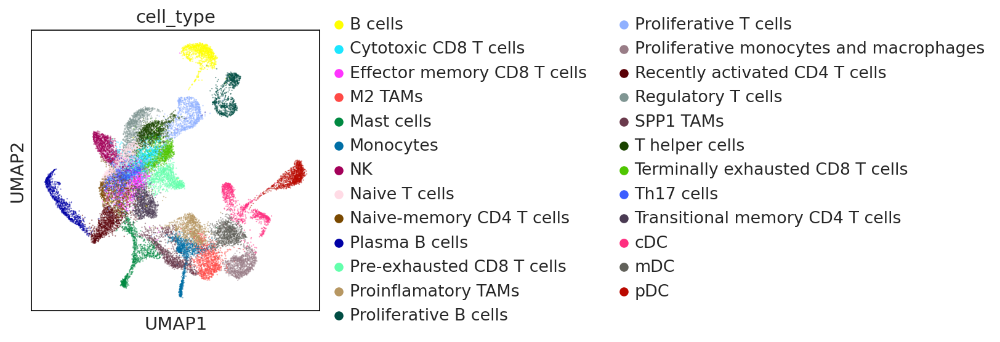

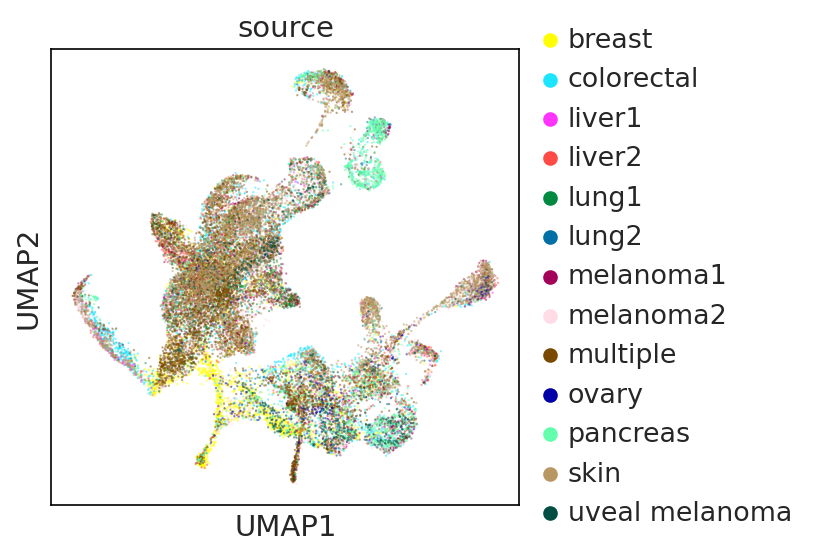

In [39]:
sc.pl.umap(adata_sub, color=['cell_type'], alpha = 0.5, palette= sc.pl.palettes.godsnot_102)
sc.pl.umap(adata_sub, color=['source'], alpha = 0.5, palette= sc.pl.palettes.godsnot_102)

output connectivity files

In [41]:
sio.mmwrite("adata_sub_connectivities",adata_sub.obsp['connectivities'].tocoo())

In [1]:
%%bash
awk -v OFS="\t" '{print "c"$1,"c"$2,$3}' adata_sub_connectivities.mtx > adata_sub_connectivities.tsv
rm adata_sub_connectivities.mtx

output attribute files with gene expression

In [125]:
adata_sub_meta = adata_sub.obs[['nCount_RNA','nFeature_RNA','patient','percent.mt','gender','source','subtype','cell_type']].reset_index(drop = True).copy()
adata_sub_meta_colnames = list(adata_sub_meta.columns)
adata_sub_meta['ID'] = ['c' + str(x) for x in np.arange(1, len(adata_sub_meta) + 1)]
adata_sub_meta = adata_sub_meta[['ID'] + adata_sub_meta_colnames]
adata_sub_express = pd.DataFrame(adata_sub.X.todense())
adata_sub_express.columns = adata_sub.var_names
# adata_sub_express = adata_sub_express[genes]
adata_sub_express = adata_sub_express[marker_genes]
pd.concat([adata_sub_meta, adata_sub_express], axis = 1).to_csv('adata_sub.markergene.attributes.tsv', sep= '\t', index = False)

# 1. Original analyses from paper
> * Pull data from 13 different studies [excel]()
> * All default procedures from the Seurat tutorial ...
    * Minimum / default QC
    * Some "raw" data is not raw count matrix
    * ~90k genes??
    * Integration using Seurat's "anchor" approach
> * Selected immune cells only (~300k out of ~500k cells total), using CD45??
> * 25 clusters

__Issues__
> * Authors claimed that they don't see source-specific clusters
> * Some clusters look odd

In [67]:
def plot_sub_celltype(cell_type):
    sc.pl.umap(adata[adata.obs['cell_type'].isin(cell_type)], 
               color=['cell_type'], alpha = 0.5, legend_loc= 'on data', legend_fontsize= 4)


... storing 'patient' as categorical
... storing 'gender' as categorical
... storing 'source' as categorical
... storing 'subtype' as categorical
... storing 'cluster_kmeans_k6' as categorical
... storing 'cell_type' as categorical


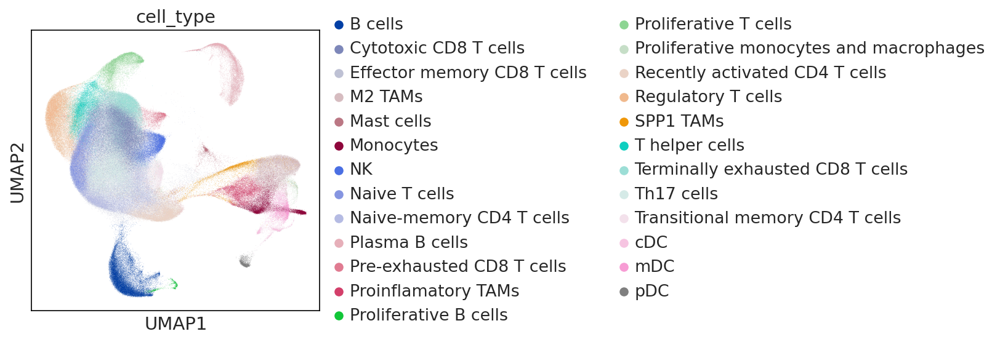

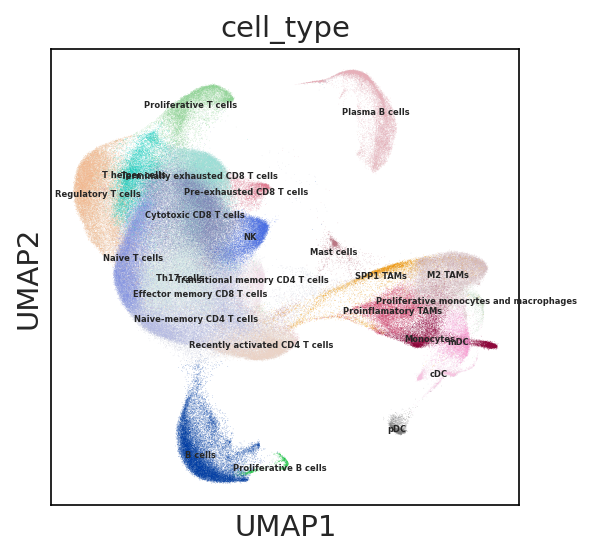

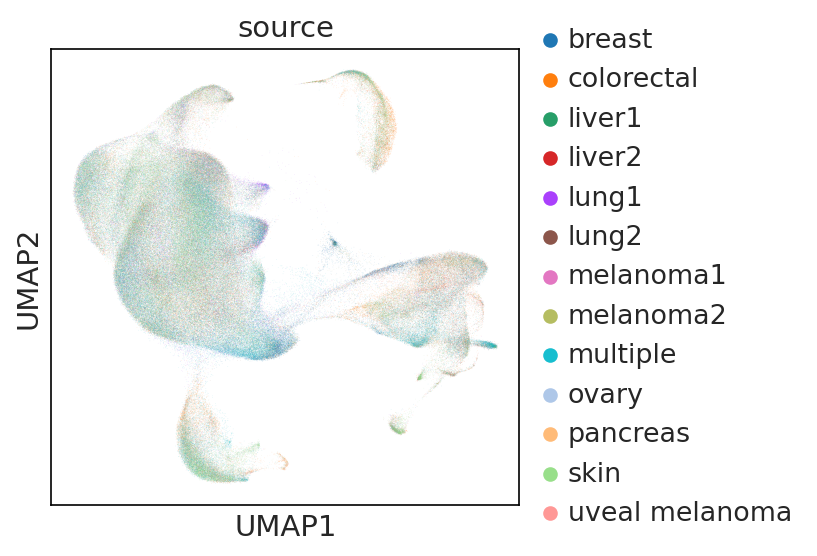

In [10]:
sc.pl.umap(adata, color=['cell_type'], alpha = 0.5)
sc.pl.umap(adata, color=['cell_type'], alpha = 0.5, legend_loc= 'on data', legend_fontsize= 4)
sc.pl.umap(adata, color=['source'], alpha = 0.2)

# 2. Density of cells by source of the datasets

In [11]:
for source_use in all_sources:
    adata_sub.obs[source_use] = ['yes ' + source_use if s==source_use else 'no ' + source_use for s in adata_sub.obs['source']]
    sc.tl.embedding_density(adata_sub, basis='umap', groupby=source_use)

... storing 'patient' as categorical
... storing 'gender' as categorical
... storing 'source' as categorical
... storing 'subtype' as categorical
... storing 'cluster_kmeans_k6' as categorical
... storing 'cell_type' as categorical
... storing 'breast' as categorical
computing density on 'umap'
--> added
    'umap_density_breast', densities (adata.obs)
    'umap_density_breast_params', parameter (adata.uns)
... storing 'colorectal' as categorical
computing density on 'umap'
--> added
    'umap_density_colorectal', densities (adata.obs)
    'umap_density_colorectal_params', parameter (adata.uns)
... storing 'liver1' as categorical
computing density on 'umap'
--> added
    'umap_density_liver1', densities (adata.obs)
    'umap_density_liver1_params', parameter (adata.uns)
... storing 'liver2' as categorical
computing density on 'umap'
--> added
    'umap_density_liver2', densities (adata.obs)
    'umap_density_liver2_params', parameter (adata.uns)
... storing 'lung1' as categorical
compu

In [1]:
adata.X

NameError: name 'adata' is not defined

In [ ]:
# for NSCLC
adata_sub.obs['NSCLC'] = ['lung1' if row['source'] == 'lung1' else (
    'lung2' if row['source'] == 'lung2' else (
    'lung3' if row['source'] == 'multiple' and row['subtype'] == 'NSCLC' else 'others')) for _,row in adata_sub.obs[['source','subtype']].iterrows()]
sc.tl.embedding_density(adata_sub, basis='umap', groupby='NSCLC')

adata_sub.obs['NSCLC_together'] = ['yes NSCLC' if s=='NSCLC' else 'no NSCLC' for s in adata_sub.obs['subtype']]
sc.tl.embedding_density(adata_sub, basis='umap', groupby='NSCLC_together')

... storing 'NSCLC' as categorical
computing density on 'umap'
--> added
    'umap_density_NSCLC', densities (adata.obs)
    'umap_density_NSCLC_params', parameter (adata.uns)
... storing 'NSCLC_together' as categorical
computing density on 'umap'
--> added
    'umap_density_NSCLC_together', densities (adata.obs)
    'umap_density_NSCLC_together_params', parameter (adata.uns)


In [21]:
# for CM
adata_sub.obs['CM'] = ['melanoma1' if row['source'] == 'melanoma1' else (
    'melanoma2' if row['source'] == 'melanoma2' else 'others') for _,row in adata_sub.obs[['source','subtype']].iterrows()]
sc.tl.embedding_density(adata_sub, basis='umap', groupby='CM')

adata_sub.obs['CM_together'] = ['yes CM' if s=='CM' else 'no CM' for s in adata_sub.obs['subtype']]
sc.tl.embedding_density(adata_sub, basis='umap', groupby='CM_together')

... storing 'CM' as categorical
computing density on 'umap'
--> added
    'umap_density_CM', densities (adata.obs)
    'umap_density_CM_params', parameter (adata.uns)
... storing 'CM_together' as categorical
computing density on 'umap'
--> added
    'umap_density_CM_together', densities (adata.obs)
    'umap_density_CM_together_params', parameter (adata.uns)


In [ ]:
def plot_density_by_source(source_use):
    sc.pl.embedding_density(adata_sub, basis='umap', key='umap_density_' + source_use)

/opt/conda/lib/python3.8/site-packages/scanpy/plotting/_tools/__init__.py:1186: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("YlOrRd"))
  color_map.set_over('black')
/opt/conda/lib/python3.8/site-packages/scanpy/plotting/_tools/__init__.py:1187: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("YlOrRd"))
  color_map.set_under('lightgray')
/opt/conda/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:364: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will be

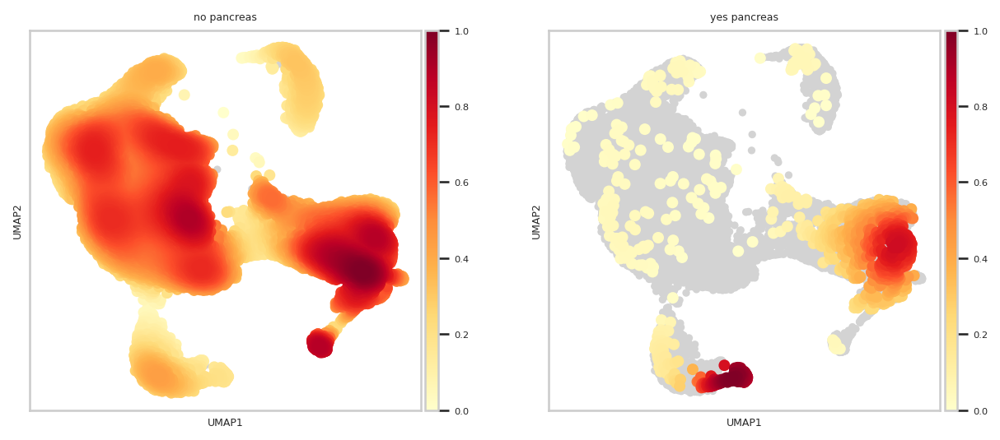

In [70]:
plot_density_by_source('pancreas')

> All cell types were present in multiple cancer types and patients (Fig. 1E,F), which supports the robustness of the integration approach.  
> ... we also found cell states enriched in specific cancer types, suggesting cancer- specific immune environments.   
 
> * proliferating B-cells were very abundant in PDAC ... [Figure 1E](figures/Figure1E.png)
> * effector memory CD8 T-cells were frequently found in EA and NSCLC. 

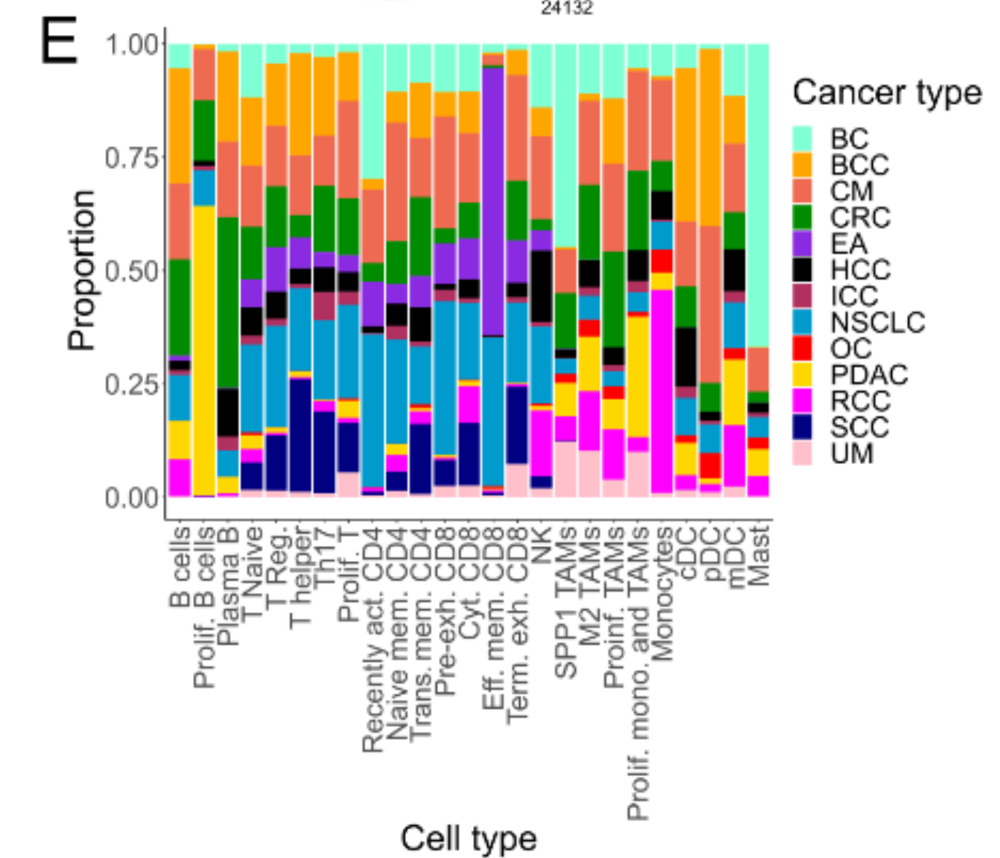

In [22]:
Image(filename='figures/Figure1E.png', width = 500)

* NSCLC samples from 3 different studies pooling together

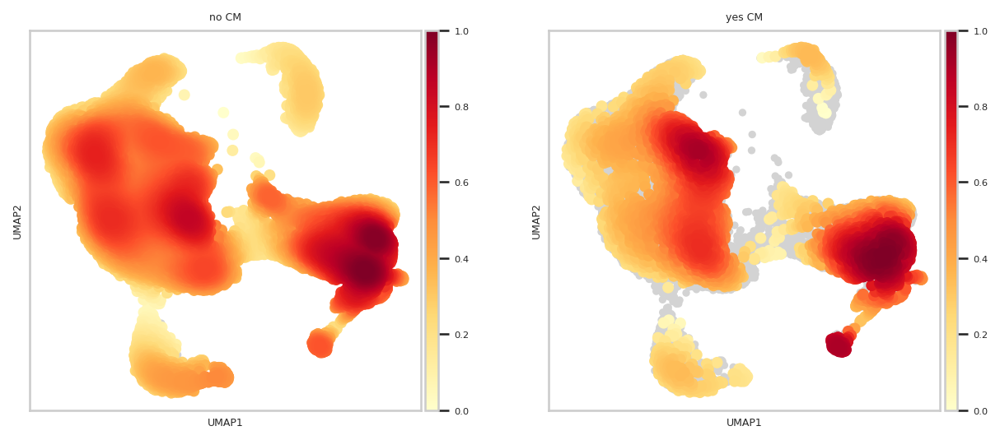

In [71]:
sc.pl.embedding_density(adata_sub, basis='umap', key='umap_density_CM_together')


* NSCLC samples from 3 different studies, plot separately

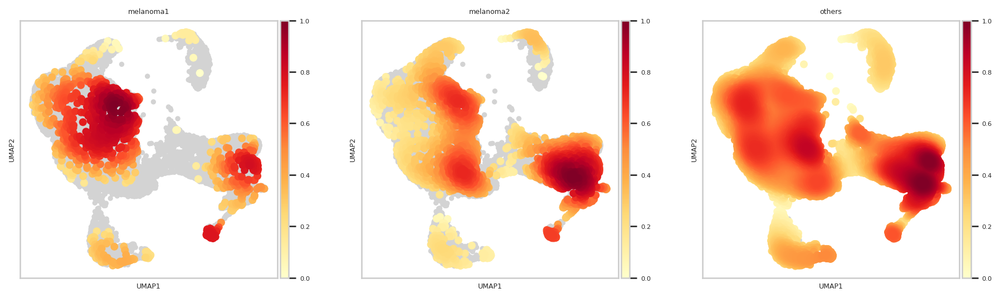

In [72]:
# For NSCLC
sc.pl.embedding_density(adata_sub, basis='umap', key='umap_density_CM')

## 2.1 Cell type composition biased by data source?
* proportion of cells from each _source_ (normalized by total cell count of each source)
* x-axis ordered by cell type abundance -------->

In [27]:
source_celltype = adata.obs.groupby(['source','cell_type']).size().unstack(fill_value=0)
source_celltype = source_celltype.div(source_celltype.sum(axis = 1), axis = 0)
source_celltype = source_celltype / source_celltype.sum()

order_by_abundance = adata.obs['cell_type'].value_counts().index.tolist()
source_celltype = source_celltype[order_by_abundance]

<AxesSubplot:xlabel='cell_type', ylabel='source'>

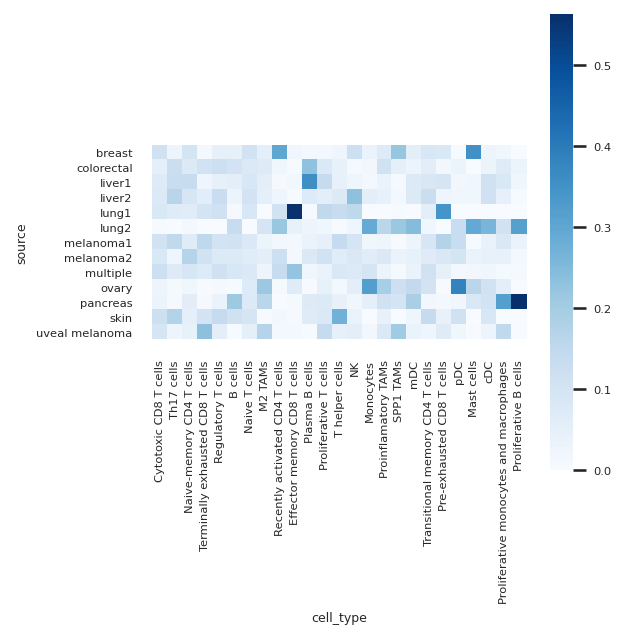

In [37]:
sns.set(style="whitegrid", font_scale=0.5)
sns.heatmap(source_celltype, annot=False, cmap="Blues", square = True)

# 3. Define cell type using pre-defined markers
* Clusters were manually annotated using canonical markers and curated gene signatures that defined their identities
> CD4 T-cells representing regulatory, helper and naive states were defined by FOXP3, CXCL13 and SELL marker gene expression, respectively (Fig. 1D, Supplemental Fig. 4). Cytotoxic CD8 T-cells expressed high levels of GZMA, while their pre- and terminally exhausted subtypes expressed IFIT3 and HAVCR2, respectively. Macrophages split in different subtypes, such as M2, SPP1 and pro-inflammatory states, with C1QB, SPP1 and CXCL8 as respective marker genes. We further observed actively dividing lymphoid and myeloid cell types with MKI67 and STMN1 as common markers for proliferation. Plasma B-cells specifically expressed IGKC, which distinguished them from naive/memory B-cells expressing MS4A1. The large number of immune cells enabled the identification of rare cell states, such as proliferative B-cells (834 cells) and macrophages (1048 cells) as well as plasmacytoid and conventional DC populations

In [38]:
marker2 = {'Treg':'FOXP3', 'T-helper':'CXCL13', 'T naive':'SELL',
          'T cytotoxic':'GZMA', 'T pre-exhausted':'IFIT3', 'T term-exhausted':'HAVCR2',
          'M2 TAM': 'C1QB', 'SPP1 TAM':'SPP1', 'M1 TAM':'CXCL8', 'proliferation': ['MKI67', 'STMN1'],
          'plasma':'IGKC', 'B naive': 'MS4A1'}

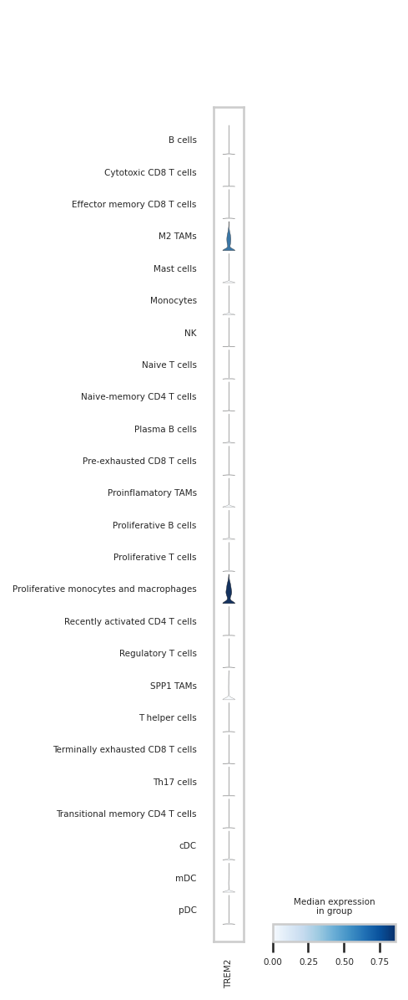

In [73]:
sc.pl.stacked_violin(adata_sub, ['TREM2'], groupby='cell_type', use_raw=False)

In [40]:
def plot_genes1(genes):
    sc.pl.stacked_violin(adata_sub,genes, groupby='cell_type', use_raw=False)

In [41]:
def plot_genes2(genes):
    sc.pl.umap(adata_sub, color = genes,
          na_in_legend = False, 
          color_map = sns.color_palette("Blues", as_cmap=True),  use_raw = False)

In [42]:
def plot_markers(celltype_set):
    marker_set = {k:i for k,i in marker.items() if k in celltype_set}
    sc.pl.stacked_violin(adata_sub, marker_set, groupby='cell_type', use_raw=False)
    sc.pl.dotplot(adata_sub, marker_set, groupby='cell_type', dendrogram=False, use_raw = False)

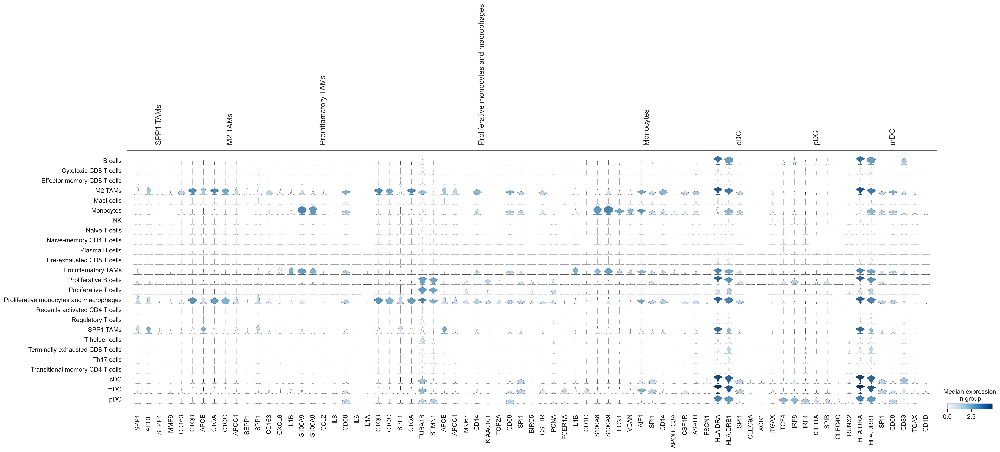

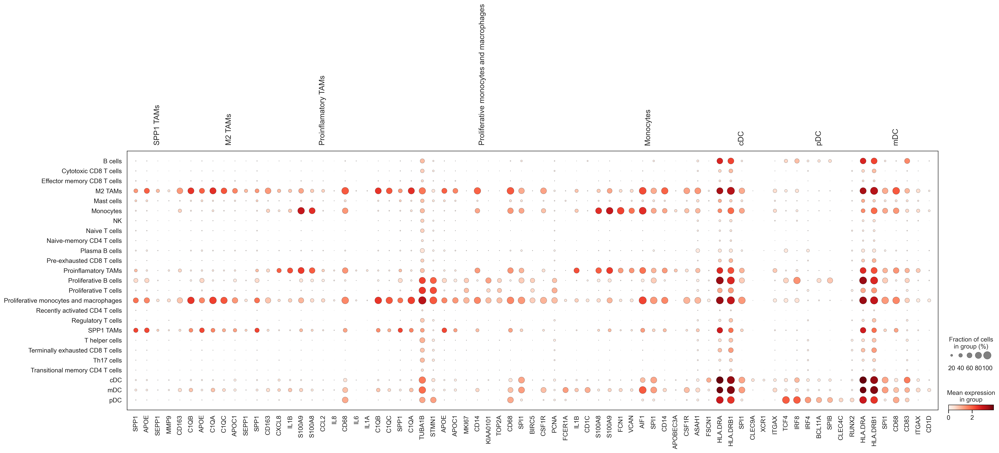

In [38]:
plot_markers(celltype_M)

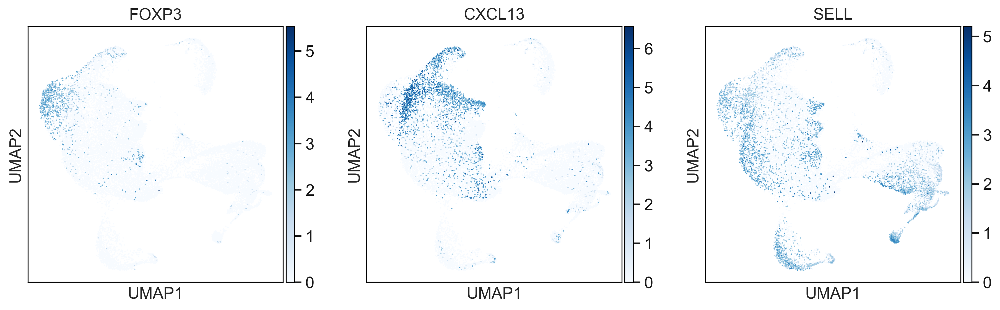

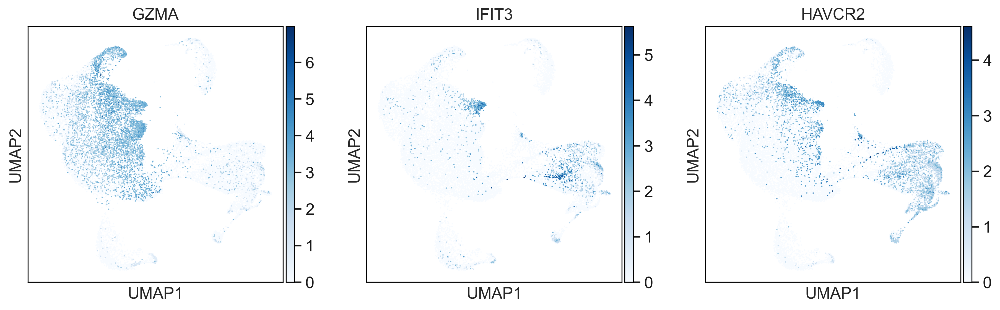

In [61]:
# Cell type signature genes?
plot_genes2(['FOXP3','CXCL13','SELL'])
plot_genes2(['GZMA', 'IFIT3', 'HAVCR2'])

# 4. Compare to cell types defined by original papers
Li H et al. 2019, melanoma2, 37,398 cells (Ido lab)

In [45]:
meta_li = pd.read_csv('data/melanoma2/Li2018_metadata.tsv', sep = '\t', header = 0)

dataset_li = adata[adata.obs['source'] == "melanoma2"].copy()
dataset_li.obs['cell_id'] = [x[:-3] for x in list(dataset_li.obs.index)]
dataset_li.obs = pd.merge(dataset_li.obs, meta_li, left_on = 'cell_id', right_index= True, how = 'left')

dataset_li.obs['Ido_annotation'] = dataset_li.obs.apply(lambda x: x['t_nk_mc_group'] if x['t_nk_mc_group'] == x['t_nk_mc_group'] else 
                                                        (x['non_t_nk_mc_group'] if x['non_t_nk_mc_group'] == x['non_t_nk_mc_group'] else np.nan), axis = 1) 

In [46]:
dataset_li_anno = dataset_li.obs[['Ido_annotation','cell_type']].copy()
dataset_li_anno = dataset_li_anno[(dataset_li_anno['Ido_annotation'] == dataset_li_anno['Ido_annotation'])]
dataset_li_anno = dataset_li_anno.groupby(['cell_type','Ido_annotation']).size().unstack(fill_value=0)
dataset_li_anno = dataset_li_anno / dataset_li_anno.sum(axis = 0)

In [47]:
order_ido = ['B','plasma','NK','cytotoxic', 'Tfh','Treg','naive', 'transitional',
             'DC', 'immature-DC', 'mature-DC', 'monocyte','non-classic-monocyte', 'pDC', 'macrophage',
             'dysf-cd4','dysfunctional','em-cd4','osteoclast']

atlas_order = celltype_B + celltype_T8 + celltype_T4 + celltype_M

In [48]:
dataset_li_anno = dataset_li_anno[order_ido].reindex(atlas_order)

* Each column adds up to 1

<AxesSubplot:xlabel='Ido_annotation', ylabel='cell_type'>

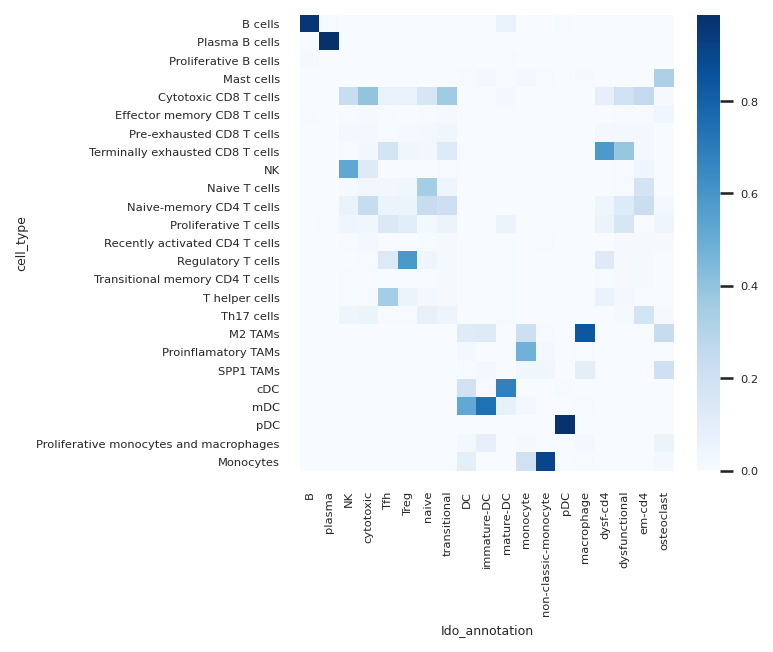

In [49]:
sns.set(style="whitegrid", font_scale=0.5)
sns.heatmap(dataset_li_anno, annot=False, cmap="Blues")

... storing 'type' as categorical
... storing 'Amp.Batch.ID' as categorical
... storing 'Cell.type' as categorical
... storing 'Processing' as categorical
... storing 'Seq.Batch.ID' as categorical
... storing 'Notes' as categorical
... storing 'Date.sorted' as categorical
... storing 'Date.processed' as categorical
... storing 'SorterID' as categorical
... storing 'SortedBy' as categorical
... storing 'LibPrepBy' as categorical
... storing 'Batch.Set.ID' as categorical
... storing 'location' as categorical
... storing 'treatment' as categorical
... storing 'new.PID' as categorical
... storing 'PatientID' as categorical
... storing 'Sample.Short.Name' as categorical
... storing 'all_mc_group' as categorical
... storing 't_nk_mc_group' as categorical
... storing 'non_t_nk_mc_group' as categorical
... storing 'Ido_annotation' as categorical


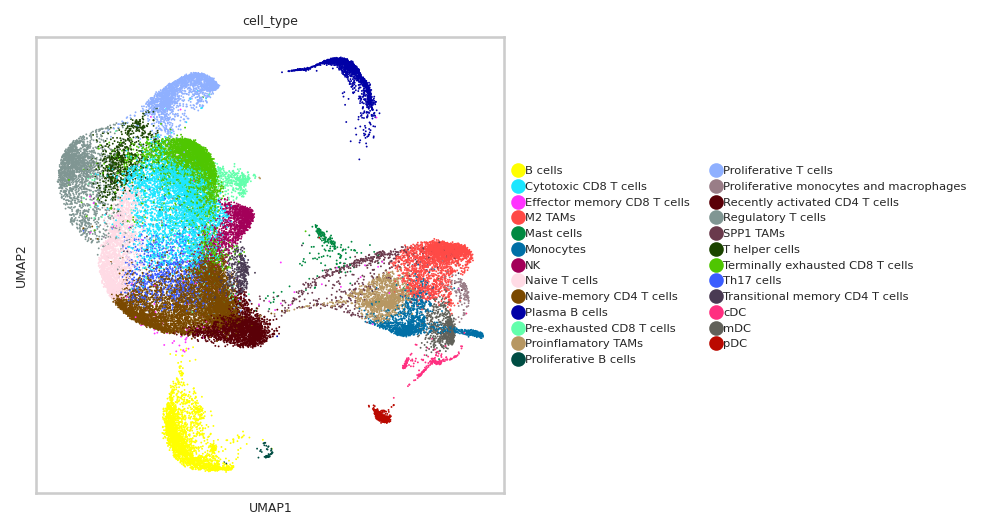

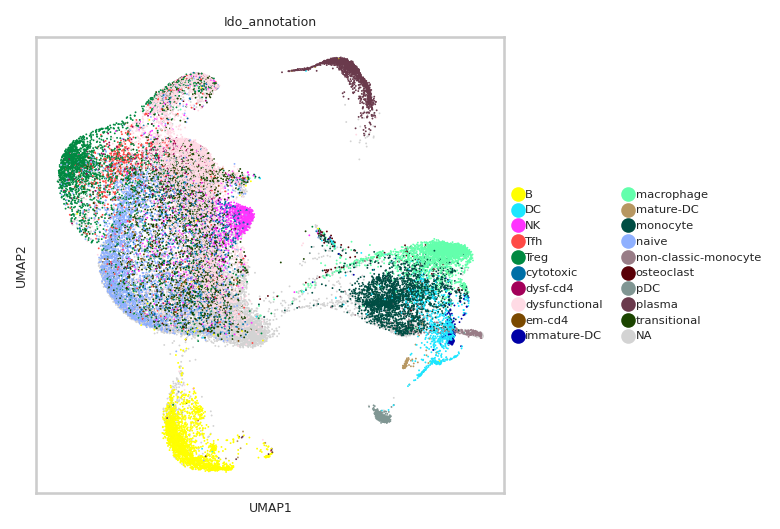

In [50]:
sc.pl.umap(dataset_li, color=['cell_type'], palette= sc.pl.palettes.godsnot_102)
sc.pl.umap(dataset_li, color=['Ido_annotation'], palette= sc.pl.palettes.godsnot_102)

More Issues from this paper:
* [GitHub](https://github.com/Single-Cell-Genomics-Group-CNAG-CRG/Tumor-Immune-Cell-Atlas)
* 20% cells not present in Ido's paper?

Trying to set attribute `.uns` of view, copying.


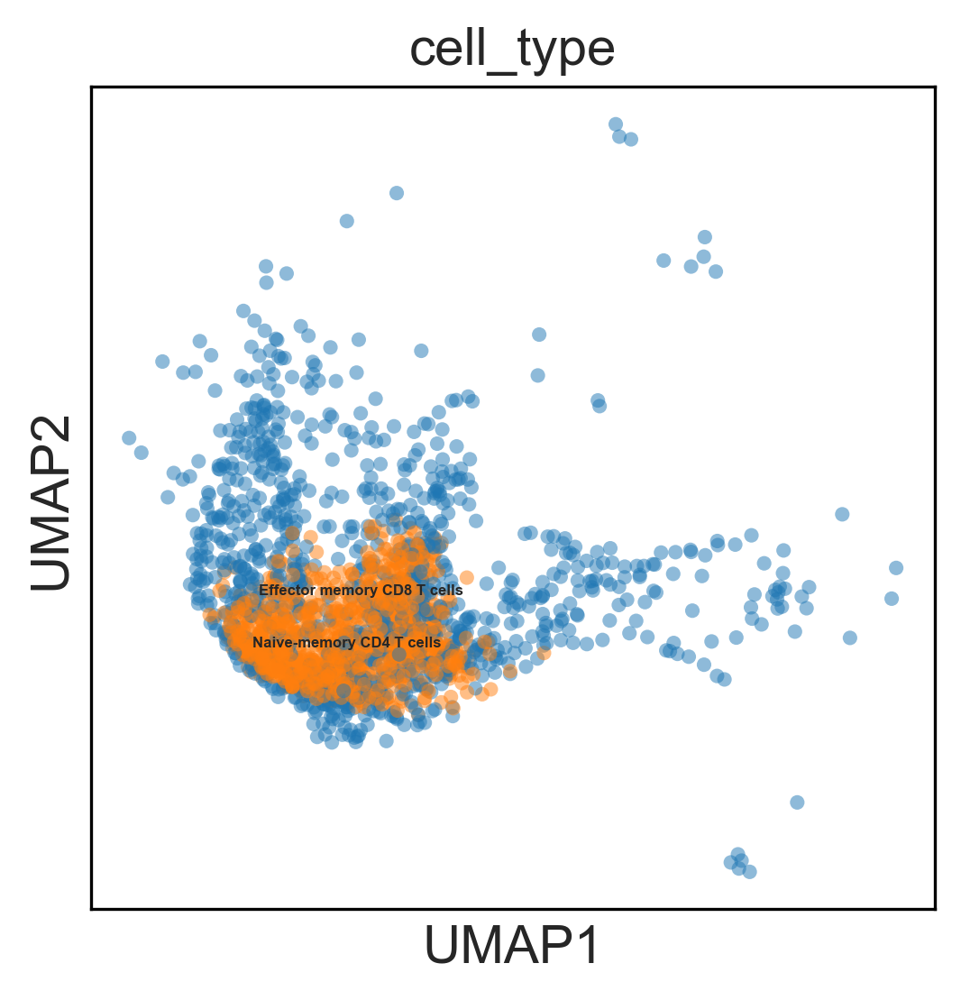

In [41]:
plot_sub_celltype(['Effector memory CD8 T cells','Naive-memory CD4 T cells'])

TODO:
- [ ] Project atlas annotation to the original dataset?
- [ ] How about a smaller dataset?
- [ ] My version of the annotation / UMAP
    * They only provide normalizations for HVGs (n = ~4000, normalized across datasets)
    * Raw count is not really "raw"
    * ~80k genes?

In [60]:
# adata_my = adata[:,adata.var_names.isin(genes)].copy()

# sc.pp.pca(adata_my, n_comps=30, use_highly_variable=False, svd_solver='arpack', )
# sc.pp.neighbors(adata_my, n_pcs = 30)
# sc.tl.umap(adata_my)
# sc.tl.louvain(adata_my, resolution=1.2, key_added='louvain_r1.2', random_state=0)


In [61]:
# sc.pl.umap(adata_my, color=['louvain_r1.2', 'cell_type', 'source'])

# 5. Annotation using DE genes
* Identify genes that distinguish the cluster (need all genes, QCed, normalized)
* Annotation using these DE genes

In [57]:
#Calculate marker genes
sc.tl.rank_genes_groups(adata_my, groupby='cell_type', key_added='rank_genes_celltype', use_raw = False)

ranking genes
    finished: added to `.uns['rank_genes_celltype']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:28)


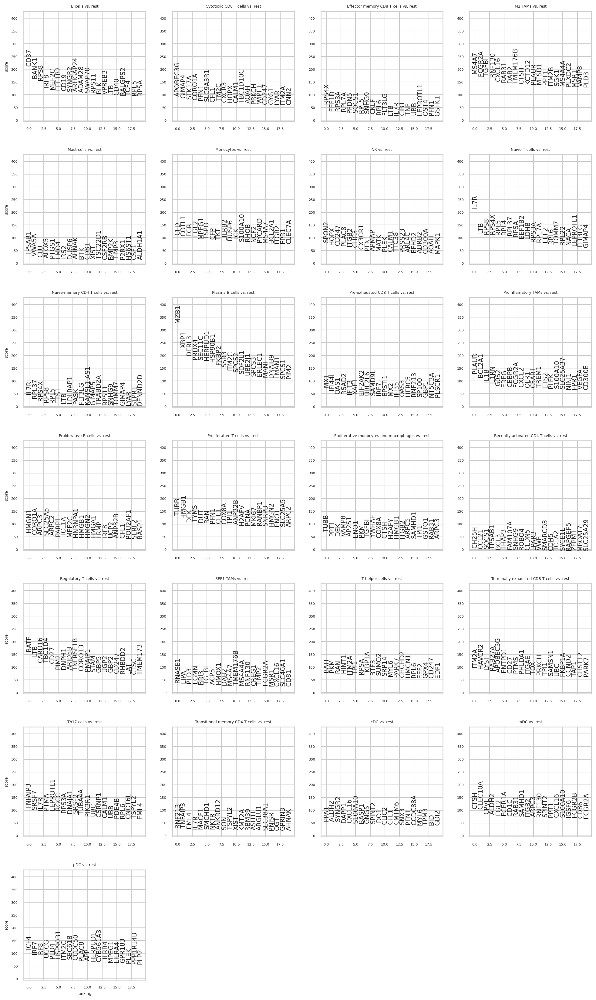

In [62]:
#Plot marker genes
# y axis: z-score underlying the computation of a p-value for each gene for each group
sc.pl.rank_genes_groups(adata_my, key='rank_genes_celltype', fontsize=10, use_raw = False)

# 5. Sub-clustering

* Macrophages

In [63]:
macrophages = [x for x in all_celltypes if 'TAMs' in x or 'macrophages' in x]

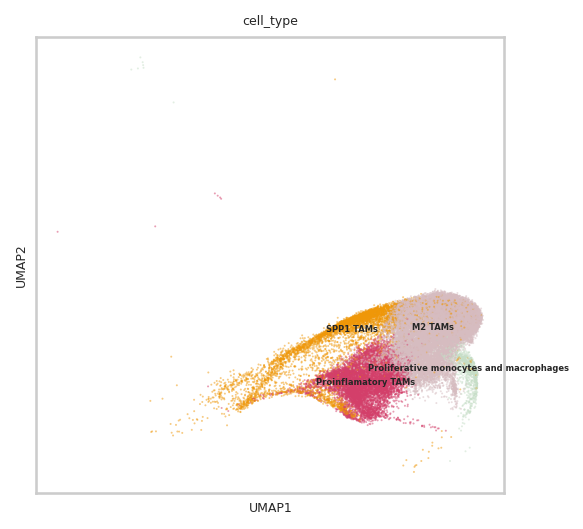

In [69]:
plot_sub_celltype(macrophages)

# Read using Seurat object

In [25]:
%%R
atlas = readRDS("/domino/datasets/hli129/TICAtlas-Hurley/scratch/TICAtlas.rds")

In [29]:
%%R
library(Seurat)
library(tidyverse)
DefaultAssay(atlas) <- "integrated"
atlas



An object of class Seurat 
92265 features across 317111 samples within 2 assays 
Active assay: integrated (4606 features, 0 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap


In [30]:
%%R
test <- atlas %>%
  FindNeighbors(reduction = "pca", dims = 1:30)

In [32]:
%%R
test <- FindClusters(test, resolution = 1.2)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 317111
Number of edges: 9178636

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8850
Number of communities: 54
Elapsed time: 175 seconds


In [33]:
%%R
p1 <- DimPlot(test, 
              reduction = "umap", 
              group.by = "source", 
              label = TRUE, 
              repel = TRUE)


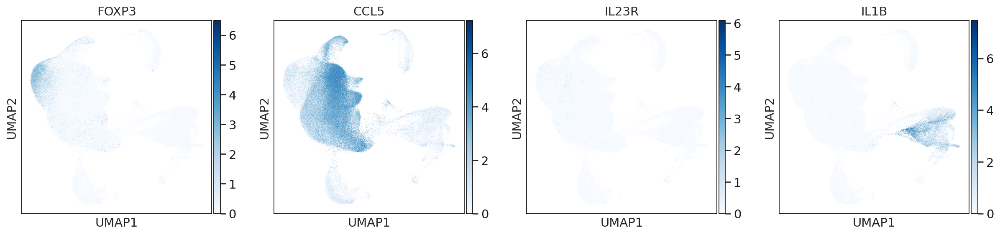

In [88]:
genes_select = ['FOXP3','CCL5','IL23R','IL1B']
sc.pl.umap(adata, color = genes_select,
          na_in_legend = False, 
          color_map = sns.color_palette("Blues", as_cmap=True),  use_raw = False)

In [203]:
import itertools
gene_select = [i for _,i in marker_select.items()]
gene_select = list(itertools.chain(*gene_select))

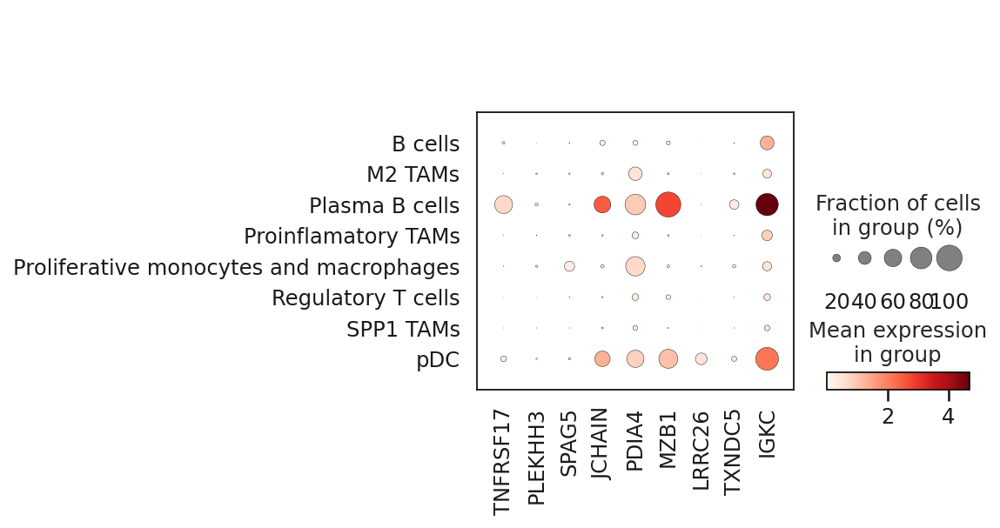

In [204]:
sc.pl.dotplot(adata[adata.obs['cell_type'].isin(select_celltype)], 
              genes_select, groupby='cell_type', dendrogram=False, use_raw = False, )

# sc.pl.umap(adata, color = 'cell_type', groups = select_celltype, na_in_legend = False,
#           palette= sc.pl.palettes.godsnot_102, na_color = '#dadfe125')

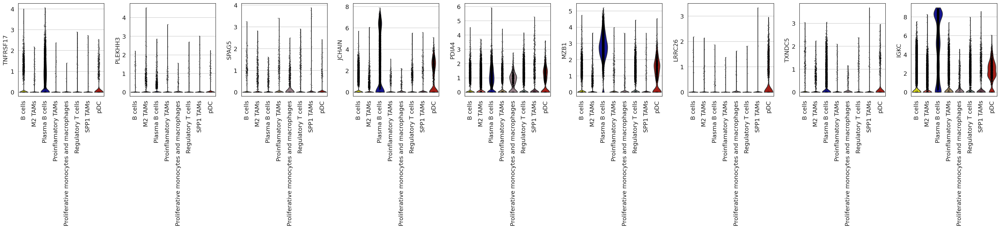

In [205]:
sc.pl.violin(adata[adata.obs['cell_type'].isin(select_celltype)], genes_select, groupby='cell_type', use_raw=False, 
                 stripplot=True, jitter=True, log = False,
                 size=1, layer=None, multi_panel = True, rotation= 90)

In [206]:
down_index = adata.obs.groupby('cell_type').apply(lambda s: s.sample(min(len(s), 500))).droplevel(0).index
adata_down = adata[down_index]

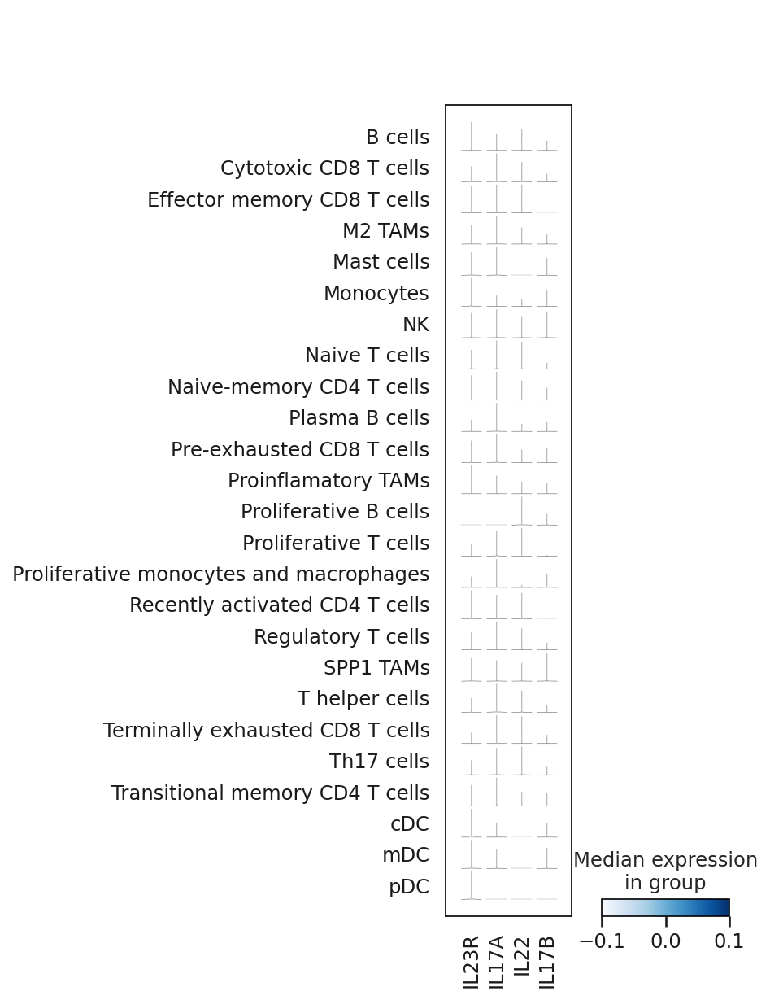

In [91]:
sc.pl.stacked_violin(adata, ['IL23R','IL17A','IL22','IL17B'], groupby='cell_type', use_raw=False, )

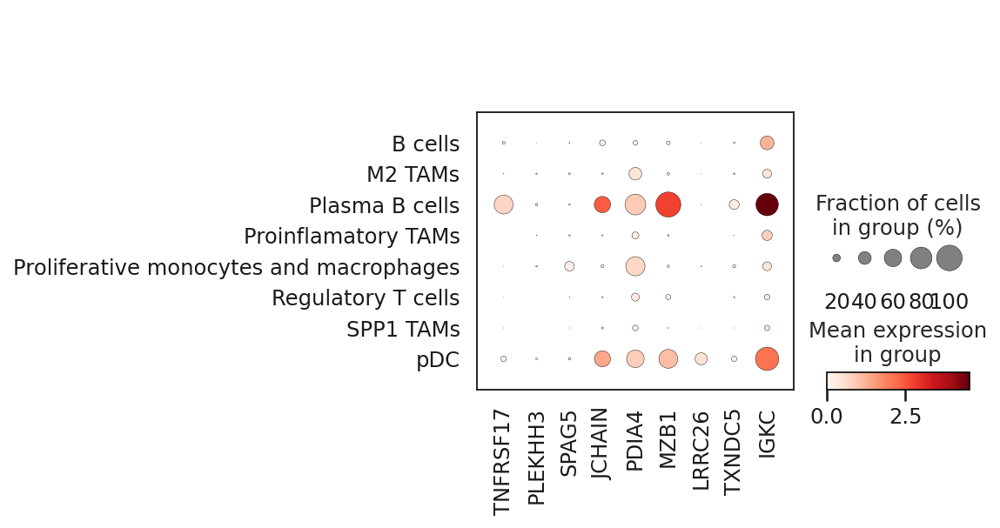

In [208]:
sc.pl.dotplot(adata_down[adata_down.obs['cell_type'].isin(select_celltype)], 
              genes_select, groupby='cell_type', dendrogram=False, use_raw = False, )

In [116]:
adata_sub = sc.pp.subsample(adata, n_obs=10000, random_state=0, copy=True)

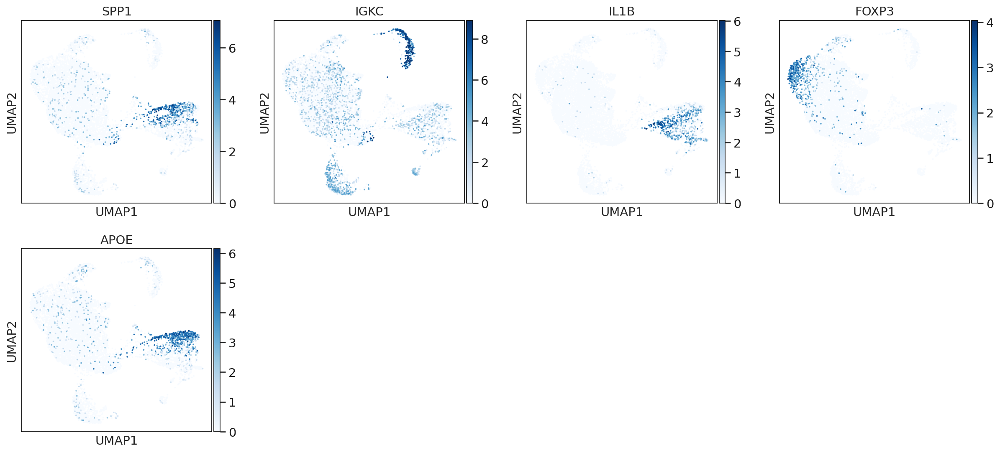

In [117]:
sc.pl.umap(adata_sub, color = ['SPP1','IGKC','IL1B','FOXP3','APOE'],na_in_legend = False, groups = select_celltype,
          color_map = sns.color_palette("Blues", as_cmap=True),  use_raw = False)

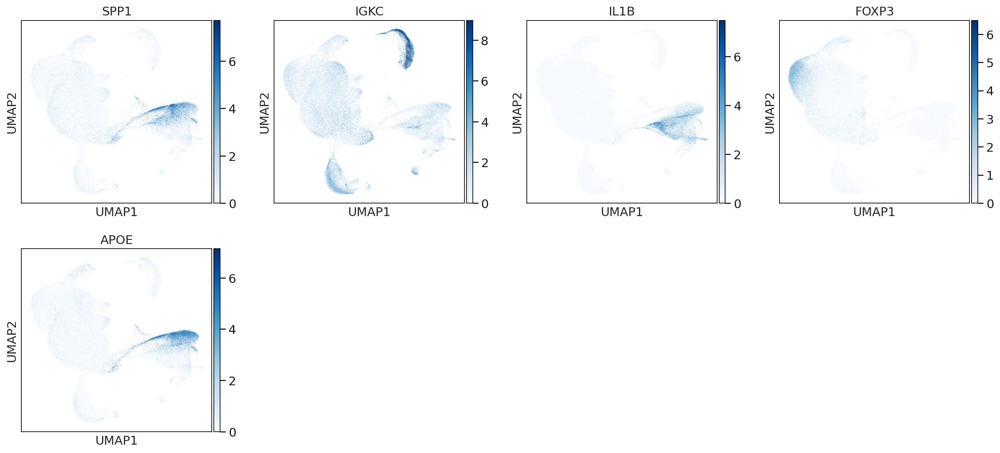

In [109]:
sc.pl.umap(adata, color = ['SPP1','IGKC','IL1B','FOXP3','APOE'],na_in_legend = False, groups = select_celltype,
          color_map = sns.color_palette("Blues", as_cmap=True),  use_raw = False)

In [55]:
tempRaw = adata.raw.to_adata()
tempRaw.var_names = adata.var_names
adata.raw = tempRaw

In [122]:
sc.pp.pca(adata, n_comps=30)

computing PCA
    with n_comps=30
    finished (0:00:39)


In [129]:
sc.pp.neighbors(adata)

computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:37)


In [135]:
pd.DataFrame(adata.obsp['connectivities'].toarray()).to_csv('test.connect.tsv', header = None, index = None)

KeyboardInterrupt: 

In [158]:
adata.obsp['distances'].tocoo()

<50000x50000 sparse matrix of type '<class 'numpy.float64'>'
	with 700000 stored elements in COOrdinate format>

In [159]:
import scipy.io as sio

In [160]:
sio.mmwrite("test.connect.mtx",adata.obsp['connectivities'].tocoo())

ModuleNotFoundError: No module named 'scipy.sparse.csr_matrix'

In [127]:
pd.DataFrame(adata.obsm['X_pca']).to_csv('test.pca.csv', header = None, index = None)

In [169]:
# markers = {'T-helper': 'CXCL13', 'B-cell': 'MS4A1', 'NK': 'PRF1'}
sc.pl.dotplot(adata_down[adata_down.obs['cell_type'].isin(['SPP1 TAMs','M2 TAMs','Proinflamatory TAMs'])], 
              marker_select, groupby='cell_type', dendrogram=True, use_raw = False, )

         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50


KeyboardInterrupt: 

In [93]:
sc.pl.stacked_violin(adata, marker, groupby='cell_type', dendrogram=False)

KeyboardInterrupt: 

Error in callback <function flush_figures at 0x7f704ce6fee0> (for post_execute):


KeyboardInterrupt: 

In [171]:
adata

AnnData object with n_obs × n_vars = 317111 × 87659
    obs: 'nCount_RNA', 'nFeature_RNA', 'patient', 'percent.mt', 'gender', 'source', 'subtype', 'cluster_kmeans_k6', 'cell_type', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'features', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    uns: 'cell_type_colors'
    obsm: 'X_umap'
    layers: 'raw2'

In [73]:
# get rid of genes that doesn't exist
sc.pp.filter_genes(adata, min_cells=100)

filtered out 56804 genes that are detected in less than 100 cells


In [170]:
sc.pp.highly_variable_genes(adata, flavor='cell_ranger', n_top_genes=4000)
sc.pl.highly_variable_genes(adata)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes


ValueError: Bin edges must be unique: array([          -inf, 1.00000000e-12, 1.00000000e-12, 1.00000000e-12,
       1.40613013e-06, 7.42503937e-06, 1.47559060e-05, 2.49761827e-05,
       4.02607893e-05, 6.47804071e-05, 1.07870364e-04, 1.85651367e-04,
       3.44212341e-04, 6.57844052e-04, 1.36885596e-03, 3.13265270e-03,
       9.62058178e-03, 3.67876869e-02, 1.10993896e-01, 4.62107859e+00,
                  inf]).
You can drop duplicate edges by setting the 'duplicates' kwarg

In [87]:
# select specific clusters
select = ['SPP1 TAMs',
          'Proinflamatory TAMs',
          'M2 TAMs',
          'Proliferative monocytes and macrophages']

select = ['pDC','cDC','mDC']

# adata_select = adata[adata.obs['cell_type'].isin(select)].copy()

adata_select = adata[adata.obs['source'].isin(['liver2'])].copy()


In [86]:
adata.obs['source'].value_counts()

multiple          82967
skin              59792
melanoma2         37398
colorectal        31367
breast            28918
liver2            17242
lung1             17077
melanoma1         14991
pancreas          10623
uveal melanoma     8513
liver1             4331
ovary              2432
lung2              1460
Name: source, dtype: int64

... storing 'patient' as categorical
... storing 'gender' as categorical
... storing 'source' as categorical
... storing 'subtype' as categorical
... storing 'cluster_kmeans_k6' as categorical
... storing 'cell_type' as categorical


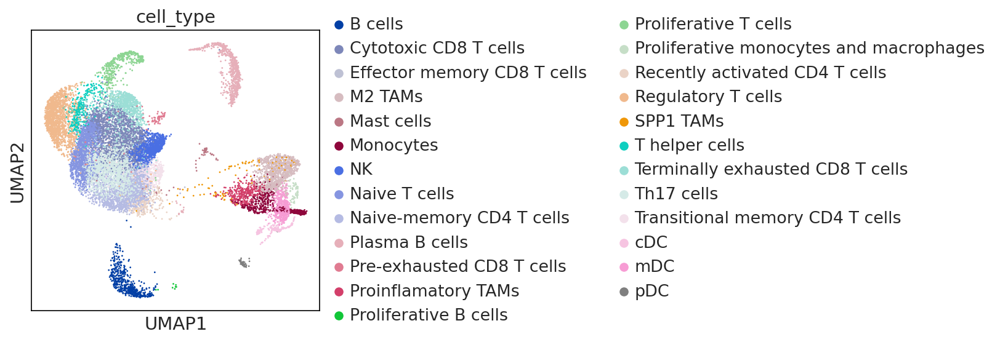

In [88]:
sc.pl.umap(adata_select,color = 'cell_type')

In [ ]:
# get rid of genes that doesn't express
# Min 20 cells - filters out 0 count genes
sc.pp.filter_genes(adata, min_cells=200)


filtered out 61604 genes that are detected in less than 200 cells


In [ ]:
adata

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


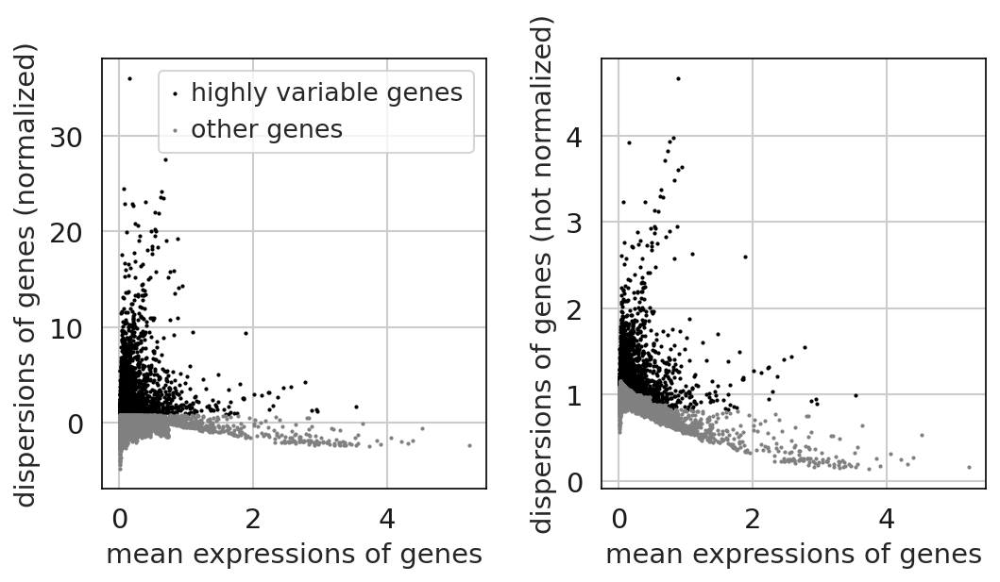

In [61]:
# sc.pp.highly_variable_genes(adata_select, flavor='cell_ranger', n_top_genes=3000)
# sc.pl.highly_variable_genes(adata_select)

In [79]:
# Calculate the visualizations
sc.pp.pca(adata_select, n_comps=50, use_highly_variable=False, svd_solver='arpack')
sc.pp.neighbors(adata_select)

sc.tl.tsne(adata_select, n_jobs=12)
sc.tl.umap(adata_select)
# sc.tl.diffmap(adata_select)
# sc.tl.draw_graph(adata_select)

computing PCA
    with n_comps=50
    finished (0:00:38)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing tSNE
    using 'X_pca' with n_pcs = 50
    using the 'MulticoreTSNE' package by Ulyanov (2017)
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:22)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:25)


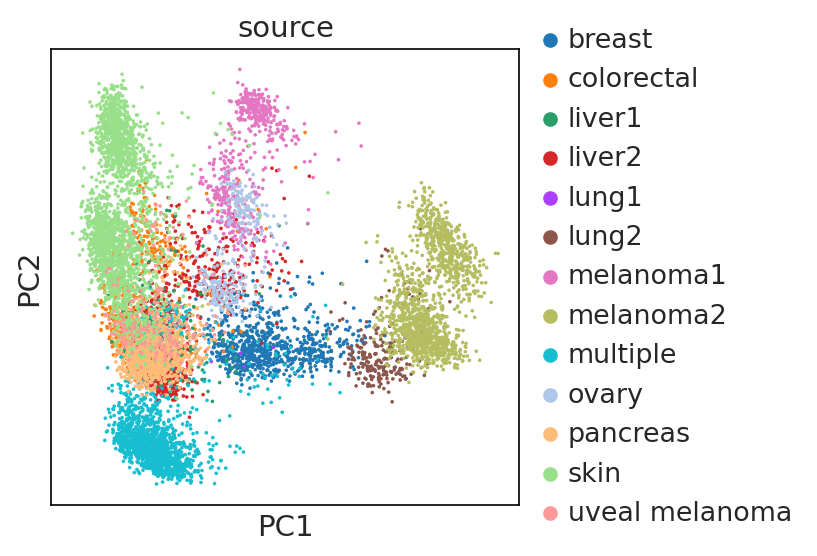

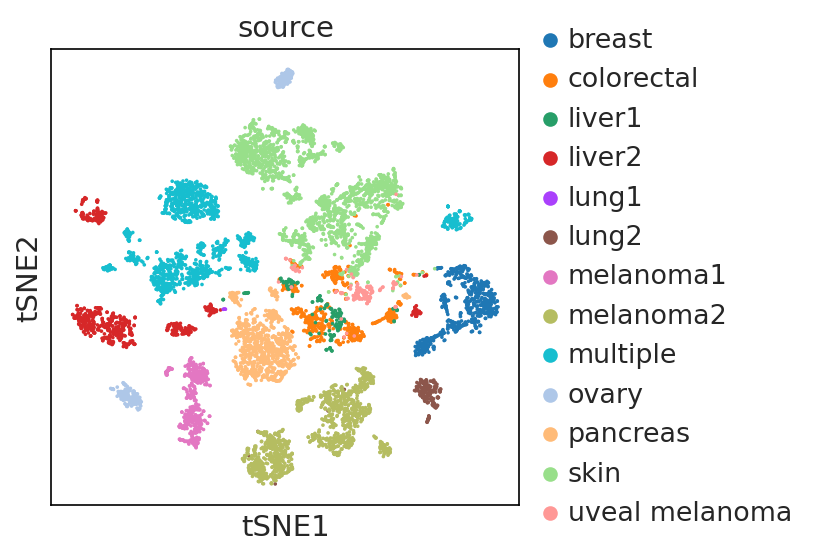

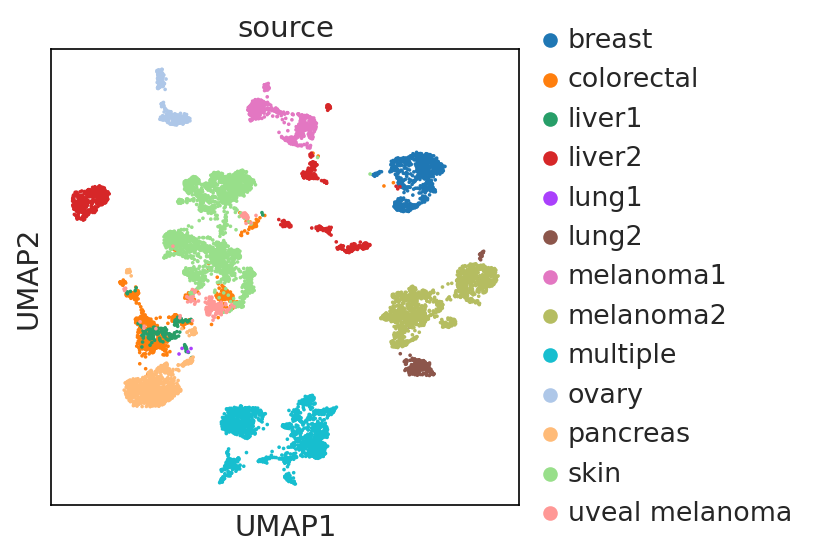

In [80]:
sc.pl.pca_scatter(adata_select, color='source')
sc.pl.tsne(adata_select, color='source')
sc.pl.umap(adata_select, color='source')
# sc.pl.diffmap(adata_select, color='source', components=['1,2','1,3'])
# sc.pl.draw_graph(adata_select, color='source')

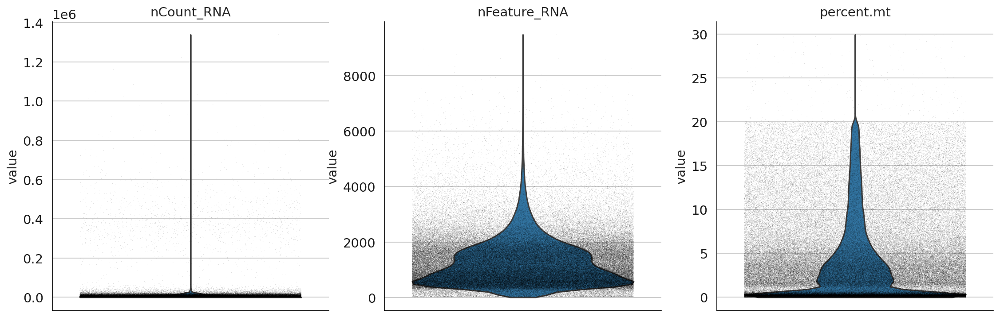

In [113]:
sc.pl.violin(adata, ['nCount_RNA', 'nFeature_RNA','percent.mt'], 
             stripplot= True, size = 0.2, jitter=0.4, multi_panel=True)

In [112]:
adata

AnnData object with n_obs × n_vars = 317111 × 87659
    obs: 'nCount_RNA', 'nFeature_RNA', 'patient', 'percent.mt', 'gender', 'source', 'subtype', 'cluster_kmeans_k6', 'cell_type', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'cell_type_colors', 'rank_genes_cell'
    obsm: 'X_umap'

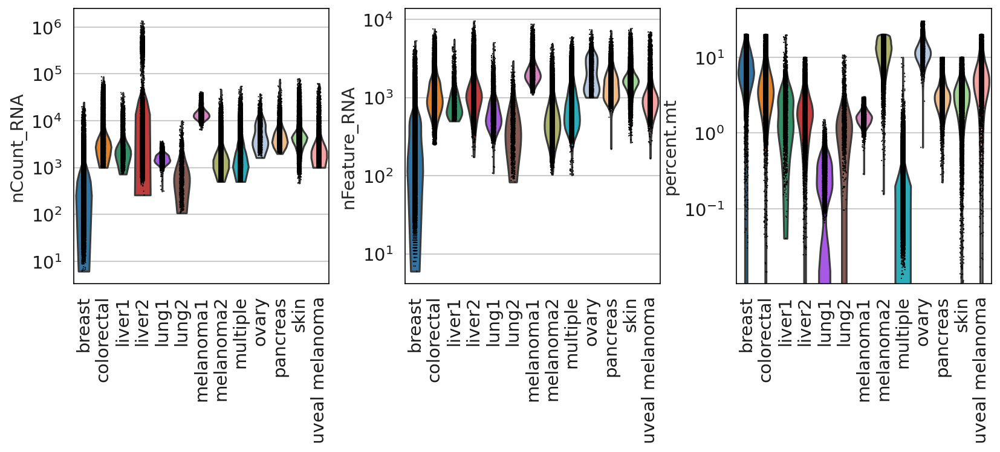

In [114]:
# Quality control - plot QC metrics
# Sample quality plots
sc.pl.violin(adata, ['nCount_RNA', 'nFeature_RNA','percent.mt'], 
             groupby='source', size=1, log=True, multi_panel= True, rotation = 90)

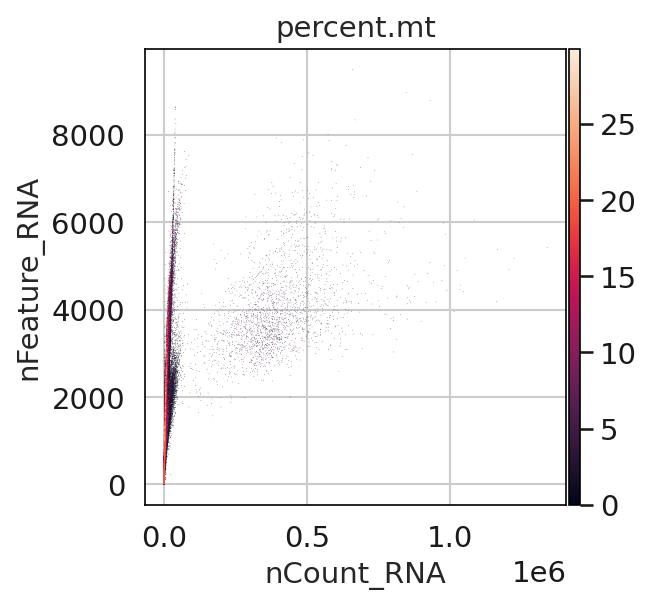

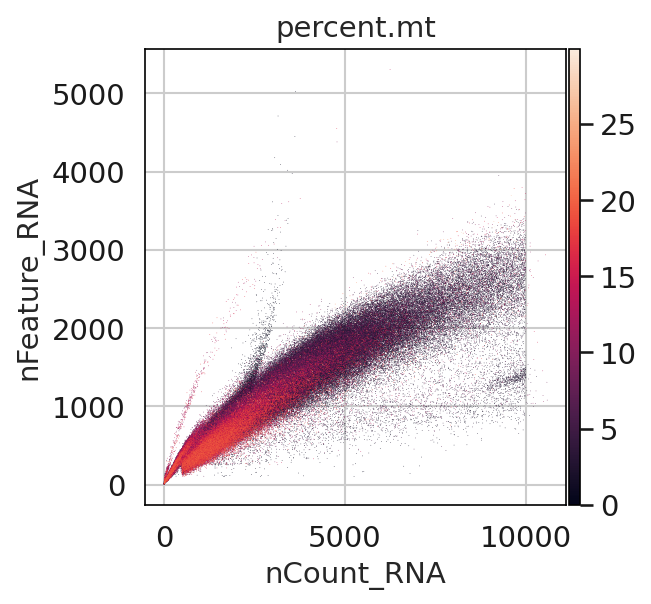

In [ ]:
#Data quality summary plots
sc.pl.scatter(adata, 'nCount_RNA', 'nFeature_RNA', color='percent.mt')

sc.pl.scatter(adata[adata.obs['total_counts']<10000], 'nCount_RNA', 'nFeature_RNA', color='percent.mt')
sc.pl.scatter(adata[adata.obs['total_counts']<10000], 'nCount_RNA', 'nFeature_RNA', color='source', alpha = 0.5)
sc.pl.scatter(adata[adata.obs['total_counts']>10000], 'nCount_RNA', 'nFeature_RNA', color='source', alpha = 0.5)

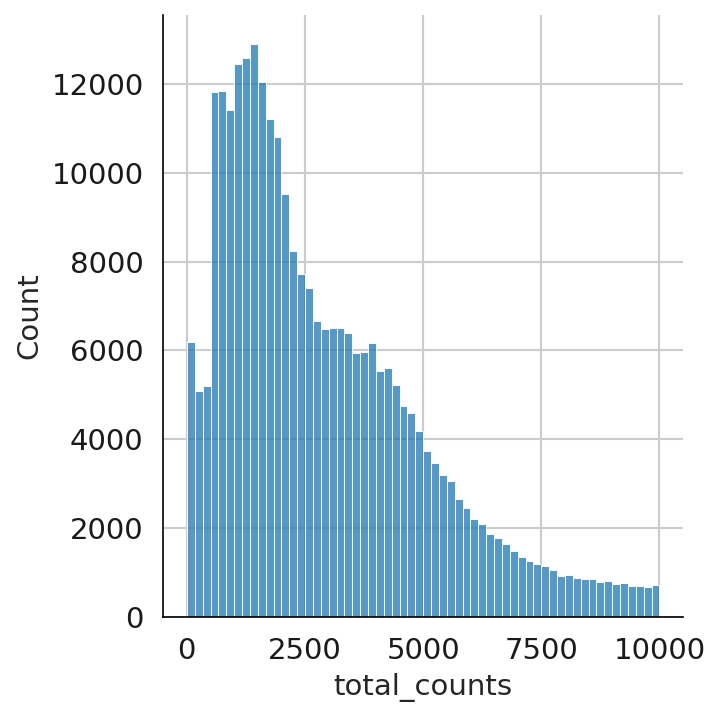

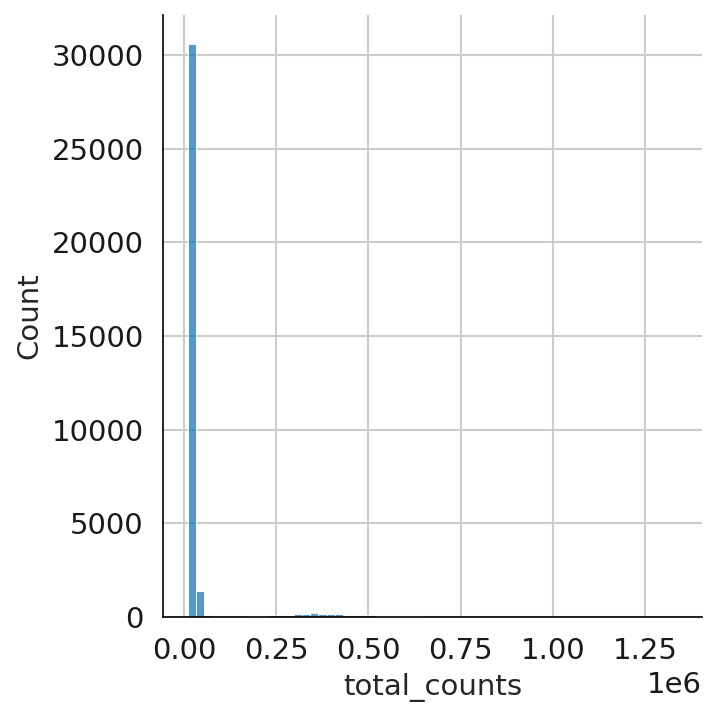

In [120]:
#Thresholding decision: counts

sns.displot(adata.obs['total_counts'][adata.obs['total_counts']<10000], kde=False, bins=60)
sns.displot(adata.obs['total_counts'][adata.obs['total_counts']>10000], kde=False, bins=60)
plt.show()

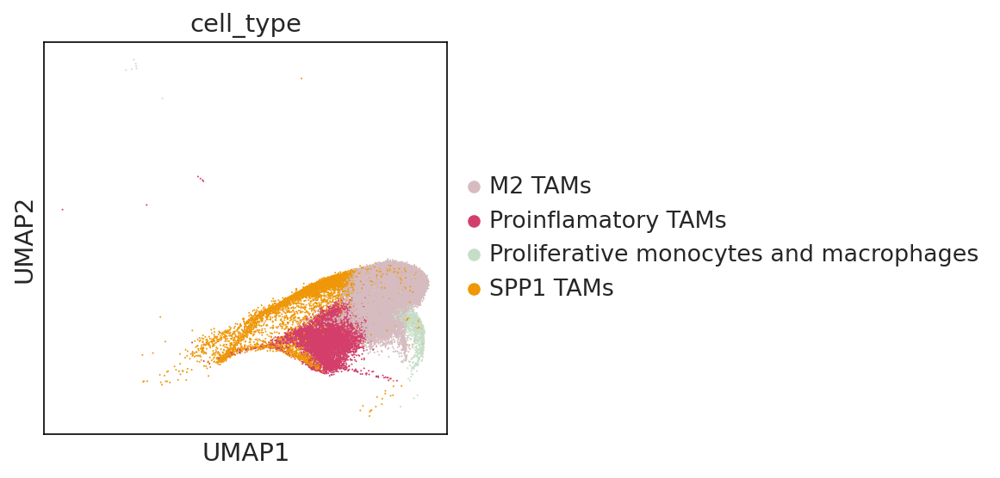

In [76]:
sc.pl.umap(adata[adata.obs['cell_type'].isin(['SPP1 TAMs','Proinflamatory TAMs','M2 TAMs','Proliferative monocytes and macrophages'])],color = 'cell_type')

... storing 'patient' as categorical
... storing 'gender' as categorical
... storing 'source' as categorical
... storing 'subtype' as categorical
... storing 'cluster_kmeans_k6' as categorical
... storing 'cell_type' as categorical


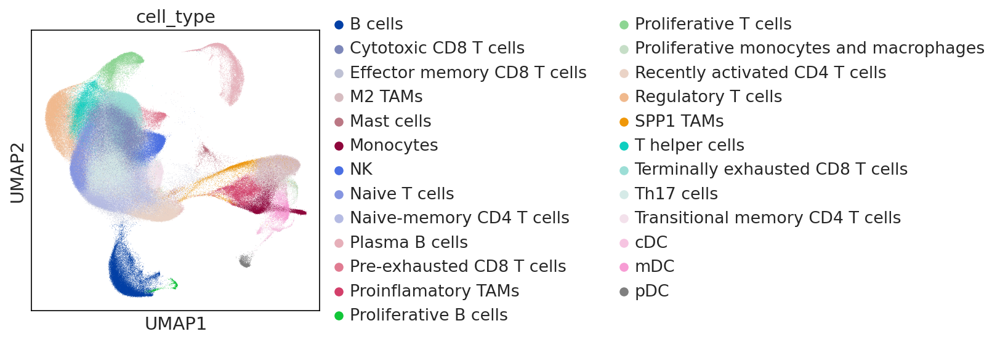

In [19]:
sc.pl.umap(adata, color = 'cell_type')

In [51]:
adata.raw.var.index = adata.raw.var['_index']

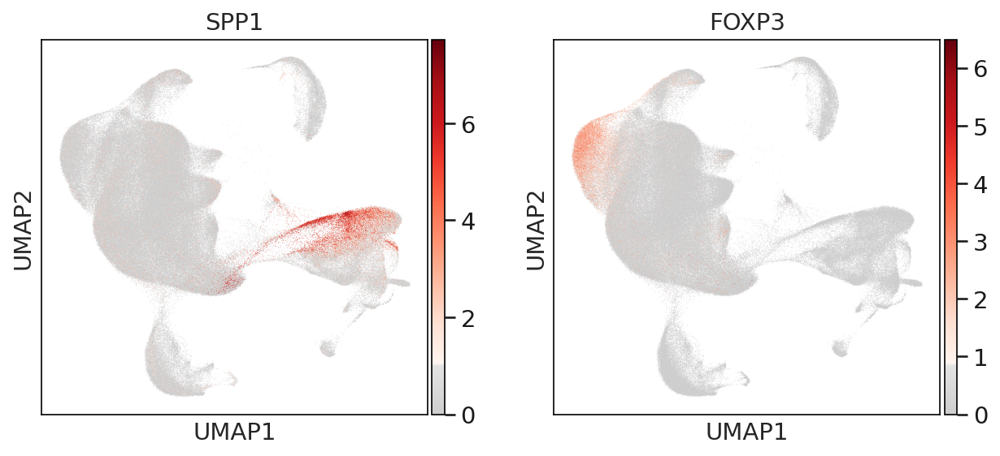

In [64]:
sc.pl.umap(adata, color = ['SPP1', 'FOXP3'], use_raw=False, color_map=mymap)

In [55]:
sc.tl.rank_genes_groups(adata, groupby='cell_type', key_added='rank_genes_cell')


ranking genes
/opt/conda/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:416: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
    finished: added to `.uns['rank_genes_cell']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:15)


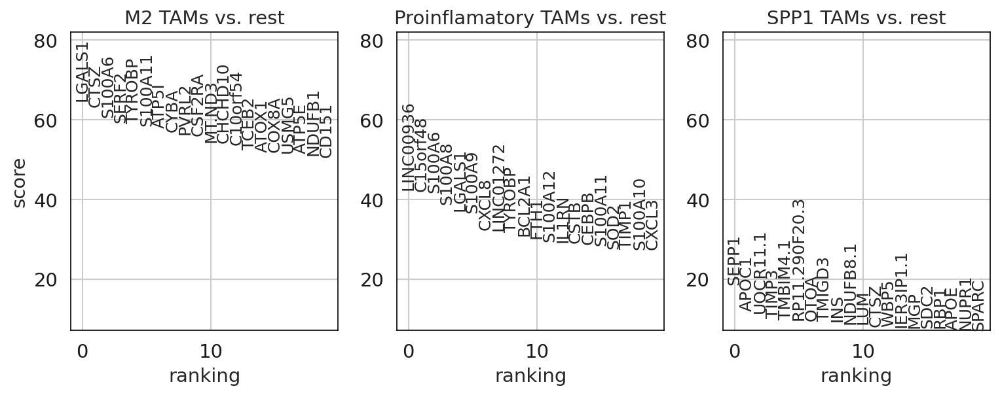

In [56]:
sc.pl.rank_genes_groups(adata, key='rank_genes_cell', groups=['M2 TAMs','Proinflamatory TAMs', 'SPP1 TAMs'], fontsize=12)
